# Using Prithvi-100M on our data

## Imports

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from osgeo import gdal
import rasterio as rio
import sklearn as sk
import scipy as sc
import seaborn as sns
import seaborn_image as isns

In [2]:
import tqdm
#from tqdm import tqdm
from tqdm.notebook import tqdm # for notebooks
tqdm.pandas()

In [3]:
import pickle
import gc
collectAll = lambda : gc.collect(0) + gc.collect(1) + gc.collect(2)

In [4]:
#from pandarallel import pandarallel
#pandarallel.initialize(progress_bar=True)

In [5]:
#import itables
#from itables import show

In [6]:
from collections import namedtuple
import itertools
from itertools import product

In [7]:
from skimage.feature import graycomatrix
from skimage.feature import graycoprops
from math import pi

In [8]:
import PIL as pil
from PIL import Image, ImageDraw

In [9]:
import geopy as gp

In [10]:
#import papermill as pm

In [11]:
import math

In [12]:
import matplotlib
matplotlib.rcParams["image.origin"] = 'upper'

## Bounds

In [20]:
import os

In [21]:
os.chdir('E:/syncable2')

### Load bounds

In [22]:
df1 = pd.read_csv("geotiffs/10May2021/bounds.csv", sep='|')
df2 = pd.read_csv("geotiffs/18Dec2020/bounds.csv", sep='|')
df1['src'] = "10May2021"
df2['src'] = "18Dec2020"
df = pd.concat((df1, df2)).reset_index()

### Load rasters and georeference.

In [23]:
bands = ['wr', 'wg', 'wb', 'r', 'g', 'b', 'nir', 'red_edge', 'ndvi', 'chm']
props = ['mean_no_glcm', 'mean', 'contrast', 'dissimilarity', 'homogeneity', 'ASM', 'energy', 'correlation']

In [24]:
def load_rasters(prefix):
    prefix = 'geotiffs/' + prefix + '/'

    wrwgwb = prefix + 'result.tif'

    r = prefix + 'result_Red.tif'
    g = prefix + 'result_Green.tif'
    b = prefix + 'result_Blue.tif'

    nir = prefix + 'result_NIR.tif'
    red_edge = prefix + 'result_RedEdge.tif'

    dsm = prefix + 'dsm.tif'

    raster_ds = rio.open(wrwgwb)
    dsm_ds = rio.open(dsm)

    arr = np.stack(
        [i for i in rio.open(wrwgwb).read()[:3]] +
        [rio.open(i).read()[0] for i in [r, g, b, nir, red_edge]], axis=2)
    arr = np.nan_to_num(arr).astype('float32')

    red = arr[:,:,bands.index('r')]
    nir = arr[:,:,bands.index('nir')]
    ndvi = np.expand_dims((nir - red) / (nir + red), axis=2)
    arr = np.concatenate((arr, ndvi), axis=2)

    dsm_coreg = np.empty(arr.shape[:2])
    dsm = np.nan_to_num(dsm_ds.read()[0])
    dsm[dsm < 0] = 0
    for row in tqdm(range(dsm_coreg.shape[0])):
        for col in range(dsm_coreg.shape[1]):
            x_y_spatial = raster_ds.transform * (col, row)
            dsm_row_col = dsm_ds.index(*(x_y_spatial))
            dsm_coreg[row,col] = dsm[dsm_row_col]
    dsm_coreg = np.expand_dims(dsm_coreg, axis=2)
    arr = np.concatenate((arr, dsm_coreg), axis=2)
    
    return arr

#img_18Dec2020 = load_rasters('18Dec2020')
#img_10May2021 = load_rasters('10May2021')

### Save fused multispectral and CHM

In [25]:
#np.save('img_18Dec2020.npy', img_18Dec2020)

In [26]:
#np.save('img_10May2021.npy', img_10May2021)

### Reload

In [27]:
img_18Dec2020 = np.load('img_18Dec2020.npy')

In [28]:
img_10May2021 = np.load('img_10May2021.npy')

In [29]:
bands = ['wr', 'wg', 'wb', 'r', 'g', 'b', 'nir', 'red_edge', 'ndvi']#, 'chm']
props = ['contrast', 'dissimilarity', 'homogeneity', 'ASM', 'energy', 'correlation']

In [30]:
#for image in [img_18Dec2020, img_10May2021]:
#    image[:,:,bands.index('chm')][image[:,:,bands.index('chm')]<0] = float('nan')

In [31]:
collectAll()

1932

### Change to the new directory

In [32]:
os.chdir('E:/27-8-2023')

### Georeference ITCs in dataframe

In [33]:
df['crop'] = None
for idx, row in df.iterrows():
    if row['src'] == '10May2021':
        img = img_10May2021
    else:
        img = img_18Dec2020
    df.at[idx, 'crop'] = img[row['y0']:row['y1'],row['x0']:row['x1']]

In [34]:
collectAll()

0

In [35]:
df.columns

Index(['index', 'name', 'y0', 'y1', 'x0', 'x1', 'src', 'crop'], dtype='object')

### Keep Cratoxylum, but fix indexing

In [36]:
df_ = df[df['name'] == "Cratoxylum Formosum"]
df = df[df['name'] != "Cratoxylum Formosum"]

In [37]:
df = df.reset_index(drop=True)
df = pd.concat((df, df_), ignore_index=True)
for idx, row in df.iterrows():
    if row['src'] == '10May2021':
        df.at[idx, 'index'] = idx

In [38]:
df[[i for i in df.columns if i not in ['crop']]]

,index,name,y0,y1,x0,x1,src
0,0,Falcataria Moluccana,2310,3100,2323,2918,10May2021
1,1,Ficus Variegata,2565,3063,1089,1612,10May2021
2,2,Bridelia Sp.,3285,3739,1314,2043,10May2021
3,3,Falcataria Moluccana,4421,5029,1516,2230,10May2021
4,4,Falcataria Moluccana,5330,6567,2054,2548,10May2021
...,...,...,...,...,...,...,...
62,29,Dillenia Suffruticosa,2931,2996,4064,4172,18Dec2020
63,30,Sterculia Parviflora,3178,3319,3629,3756,18Dec2020
64,31,Ficus Variegata,6466,6845,3372,3571,18Dec2020
65,32,Spathodea Campanulatum,1369,1776,2571,2849,18Dec2020


In [39]:
#print(df[['index', 'src', 'name']].to_string())

### Save and reload

In [40]:
df.to_pickle('df_intermediate.pickle')

In [41]:
df = pd.read_pickle('df_intermediate.pickle')

## Draw all pairs of ITCs, so we can filter

In [42]:
def crop_center(img,cropx,cropy):
    y,x = img.shape[:2]
    startx = x//2-(cropx//2)
    starty = y//2-(cropy//2)    
    return img[starty:starty+cropy,startx:startx+cropx]

In [193]:
str(dfrow[['index', 'name', 'src']])

'index                        32\nname     Spathodea Campanulatum\nsrc                   18Dec2020\nName: 65, dtype: object'

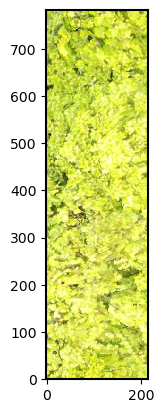

In [196]:
plt.imshow(df.iloc[-1]['crop'][:,:,:3].astype('uint8'))

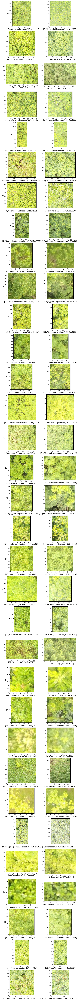

In [194]:
fig, ax = plt.subplots(len(df)//2, 2, figsize=(5.6*2, 4.8*(len(df)//2)))
for row_idx, row, group in zip(range(len(ax)), ax, df.groupby('index')):
    group = group[1]
    for col_idx, col, dfrow in zip(range(2), row, group.iterrows()):
        dfrow = dfrow[1]
        col.imshow(dfrow['crop'][:,:,:3].astype('uint8'))
        col.set_xlabel(str([dfrow['index'], dfrow['name'], dfrow['src']]))
    row[0].set_ylabel(row_idx)

### Save the filtered bounds

In [ ]:
df_nocrop = df[[i for i in df.columns if i not in ['crop']]]

In [ ]:
df_nocrop_filtered = df_nocrop[~((df_nocrop['index'] == 9) & (df_nocrop['src'] == '18Dec2020'))]
df_nocrop_filtered = df_nocrop_filtered[~(df_nocrop_filtered['index'] == 28)]

In [ ]:
may = df_nocrop_filtered[df_nocrop_filtered['src']=='10May2021']
dec = df_nocrop_filtered[df_nocrop_filtered['src']=='18Dec2020']

In [ ]:
renamer = {
    'y0': 'minr',
    'y1': 'maxr',
    'x0': 'minc',
    'x1': 'maxc'
}

In [ ]:
may = may.rename(columns=renamer)
dec = dec.rename(columns=renamer)

In [ ]:
from uuid import uuid4

In [ ]:
may['uuid'] = may.apply(lambda x: uuid4(), axis=1)
dec['uuid'] = dec.apply(lambda x: uuid4(), axis=1)

In [ ]:
may = may.set_index('index')[['name', 'src', 'uuid', 'minr', 'minc', 'maxr', 'maxc']]
dec = dec.set_index('index')[['name', 'src', 'uuid', 'minr', 'minc', 'maxr', 'maxc']]

In [ ]:
paired_uuids = pd.concat((may['uuid'], dec['uuid']), ignore_index=False, axis=1).dropna()

In [ ]:
paired_uuids['distance_px'] = 'N/A'
paired_uuids.columns = ['10May2021', '18Dec2020', 'distance_px']

In [ ]:
may.to_csv('10May2021_manual_bounds.csv')
dec.to_csv('18Dec2020_manual_bounds.csv')
paired_uuids.to_csv('10May2021_18Dec2020_manual_bounds_matched.csv')

In [ ]:
may.to_json('10May2021_manual_bounds.json', default_handler=str)
dec.to_json('18Dec2020_manual_bounds.json', default_handler=str)
paired_uuids.to_json('10May2021_18Dec2020_manual_bounds_matched.json', default_handler=str)

## Run the Prithvi-100M model on our stuff.

### Load in pytorch and our model weights.

In [43]:
import torch

In [46]:
torch.cuda.is_available()

True

In [47]:
cpu = torch.device('cpu')

In [48]:
weights = torch.load("Prithvi_100M.pt")

#### Look at the weights

In [57]:
list(weights.items())[0][1].is_cuda

True

In [49]:
[print(i) for i in weights.keys()]
None

cls_token
pos_embed
mask_token
decoder_pos_embed
patch_embed.proj.weight
patch_embed.proj.bias
blocks.0.norm1.weight
blocks.0.norm1.bias
blocks.0.attn.qkv.weight
blocks.0.attn.qkv.bias
blocks.0.attn.proj.weight
blocks.0.attn.proj.bias
blocks.0.norm2.weight
blocks.0.norm2.bias
blocks.0.mlp.fc1.weight
blocks.0.mlp.fc1.bias
blocks.0.mlp.fc2.weight
blocks.0.mlp.fc2.bias
blocks.1.norm1.weight
blocks.1.norm1.bias
blocks.1.attn.qkv.weight
blocks.1.attn.qkv.bias
blocks.1.attn.proj.weight
blocks.1.attn.proj.bias
blocks.1.norm2.weight
blocks.1.norm2.bias
blocks.1.mlp.fc1.weight
blocks.1.mlp.fc1.bias
blocks.1.mlp.fc2.weight
blocks.1.mlp.fc2.bias
blocks.2.norm1.weight
blocks.2.norm1.bias
blocks.2.attn.qkv.weight
blocks.2.attn.qkv.bias
blocks.2.attn.proj.weight
blocks.2.attn.proj.bias
blocks.2.norm2.weight
blocks.2.norm2.bias
blocks.2.mlp.fc1.weight
blocks.2.mlp.fc1.bias
blocks.2.mlp.fc2.weight
blocks.2.mlp.fc2.bias
blocks.3.norm1.weight
blocks.3.norm1.bias
blocks.3.attn.qkv.weight
blocks.3.attn.qk

In [60]:
weights['cls_token'].shape, weights['cls_token'].mean()

(torch.Size([1, 1, 768]), tensor(-0.0003, device='cuda:0'))

In [283]:
weights['pos_embed'].shape, weights['pos_embed'].mean()

(torch.Size([1, 589, 768]), tensor(0.4772))

In [288]:
589 == (3 // 1) * (224 // 16) * (224 // 16) + 1

True

In [290]:
weights['patch_embed.proj.weight'].shape

torch.Size([768, 6, 1, 16, 16])

Ah, so it convolves separately on each layer, producing 768 channels...

Output: (N, 768, 3, 14, 14). Flattened on last 3 layers, then transpose the last two layers.

So, the output is then: N, 588, 768, where L=588 is indexed along W, H and then T.

So that's how we can do a variable number of frames, but not a variable frame size or channel count without extract effort.

Because each conv kernel actually convolves across 6 layers at a time.

Hmmm... We could try convolving anyways?

### Try just the input convolutions on a 224x224 crop of our input TIF.

In [294]:
bands

['wr', 'wg', 'wb', 'r', 'g', 'b', 'nir', 'red_edge', 'ndvi']

In [73]:
img_18Dec2020_224x224 = img_18Dec2020[1000:1224,1000:1224, [bands.index(i) for i in ['wr', 'wg', 'wb', 'nir', 'nir', 'nir']]]

In [74]:
img_18Dec2020_224x224 = img_18Dec2020_224x224.transpose(2, 0, 1).reshape((1, 6, 1, 224, 224))

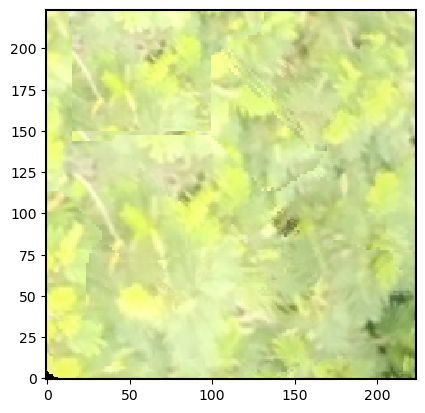

In [369]:
plt.imshow(img_18Dec2020_224x224[0,:3,0,:,:].transpose(1, 2, 0).astype('uint8'))

In [61]:
def whiten_image(x):
    return (x-x.mean(axis=(0,1)))/x.std(axis=(0,1))

In [62]:
def whiten_image_tensor(x):
    return (x-x.mean(axis=(3,4), keepdims=True))/x.std(axis=(3,4), keepdims=True)

In [336]:
def minmax_image(x):
    return (x-x.min(axis=(0,1)))/(x.max(axis=(0,1)) - x.min(axis=(0,1)))

In [349]:
def minmax_image_tensor(x):
    return (x-x.min(axis=(3,4), keepdims=True))/(x.max(axis=(3,4), keepdims=True) - x.min(axis=(3,4), keepdims=True))

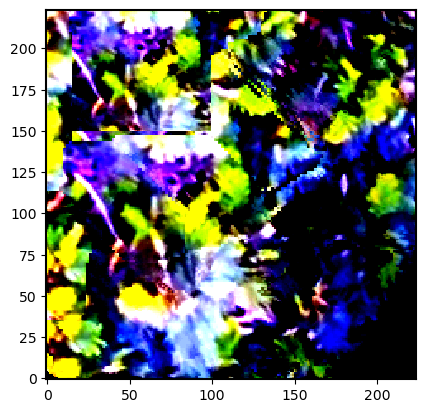

In [507]:
plt.imshow(whiten_image_tensor(img_18Dec2020_224x224)[0,:3,0,:,:].transpose(1, 2, 0))

In [65]:
from Prithvi import PatchEmbed

In [67]:
torch.set_grad_enabled(False)

In [68]:
patchEmbed = PatchEmbed(num_frames=1, in_chans=6)

In [69]:
[print(i) for i in list(weights.keys())[:10]]
None

cls_token
pos_embed
mask_token
decoder_pos_embed
patch_embed.proj.weight
patch_embed.proj.bias
blocks.0.norm1.weight
blocks.0.norm1.bias
blocks.0.attn.qkv.weight
blocks.0.attn.qkv.bias


In [70]:
patchEmbed.eval()

PatchEmbed(
  (proj): Conv3d(6, 768, kernel_size=(1, 16, 16), stride=(1, 16, 16))
  (norm): Identity()
)

In [71]:
patchEmbed.proj.weight = torch.nn.Parameter(weights['patch_embed.proj.weight'])
patchEmbed.proj.bias = torch.nn.Parameter(weights['patch_embed.proj.bias'])

In [77]:
img_18Dec2020_224x224.dtype

dtype('float32')

In [87]:
x = patchEmbed.forward(torch.tensor(whiten_image_tensor(img_18Dec2020_224x224)).cuda()).detach()

In [88]:
x = x.reshape(14, 14, 16, 48)

<Axes: ylabel='Count'>

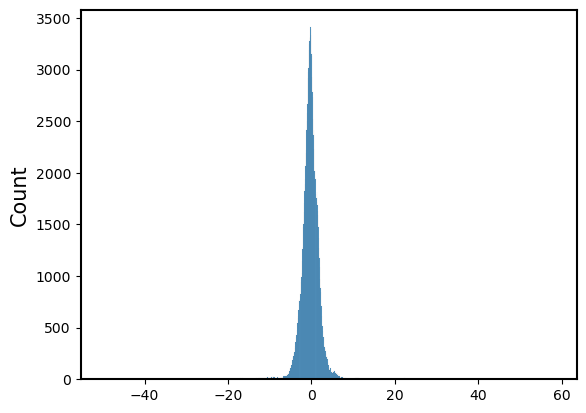

In [449]:
sns.histplot(x.flatten())

0it [00:00, ?it/s]

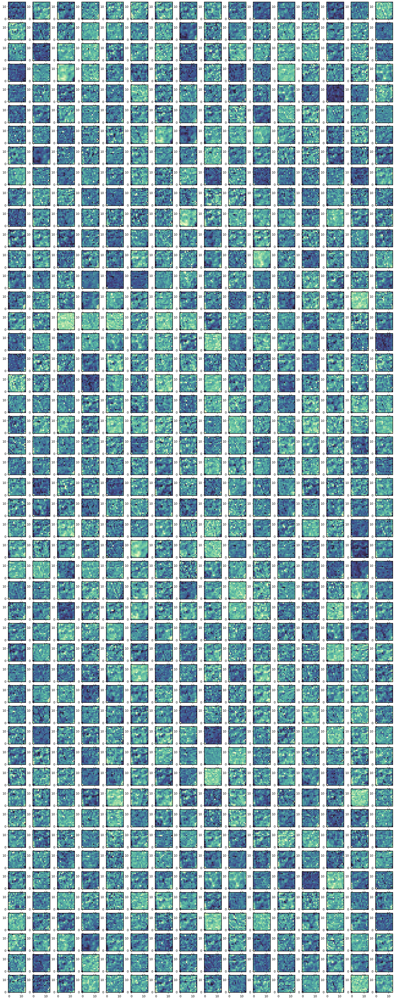

In [453]:
fig, ax = plt.subplots(48, 16, figsize=(5.6*4, 4.8*12))
for i, j in tqdm(product(range(48), range(16))):
    ax[i][j].imshow(x[:,:,j,i])

In [89]:
torch.cuda.empty_cache() 

### What about if we do the same, but with the provided TIF file?

In [90]:
example_tif = rio.open('../Prithvi-100M-demo/HLS.L30.T13REN.2018013T172747.v2.0.B02.B03.B04.B05.B06.B07_cropped.tif').read()

In [91]:
example_tif = example_tif[:,:224,:224]

In [92]:
example_tif = example_tif.reshape((1, 6, 1, 224, 224))

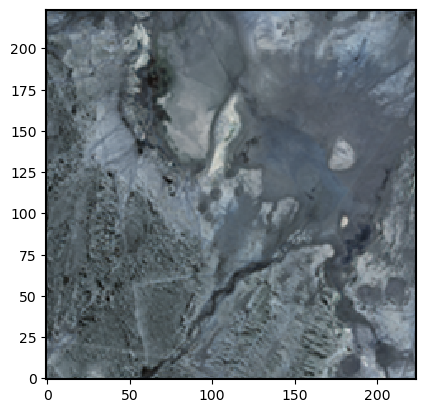

In [93]:
plt.imshow(minmax_image_tensor(example_tif)[0,:3,0,:,:].transpose(1,2,0))

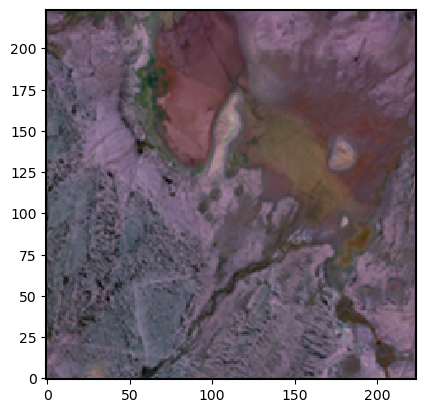

In [94]:
plt.imshow(minmax_image_tensor(example_tif)[0,3:,0,:,:].transpose(1,2,0))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


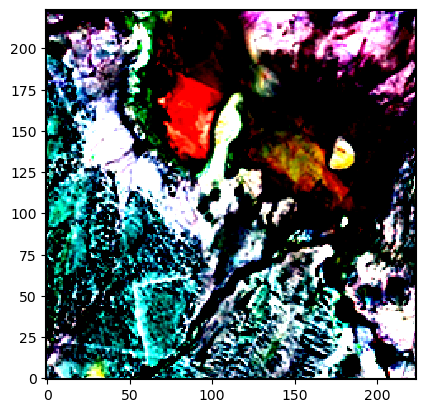

In [95]:
plt.imshow(whiten_image_tensor(example_tif)[0,3:,0,:,:].transpose(1,2,0))

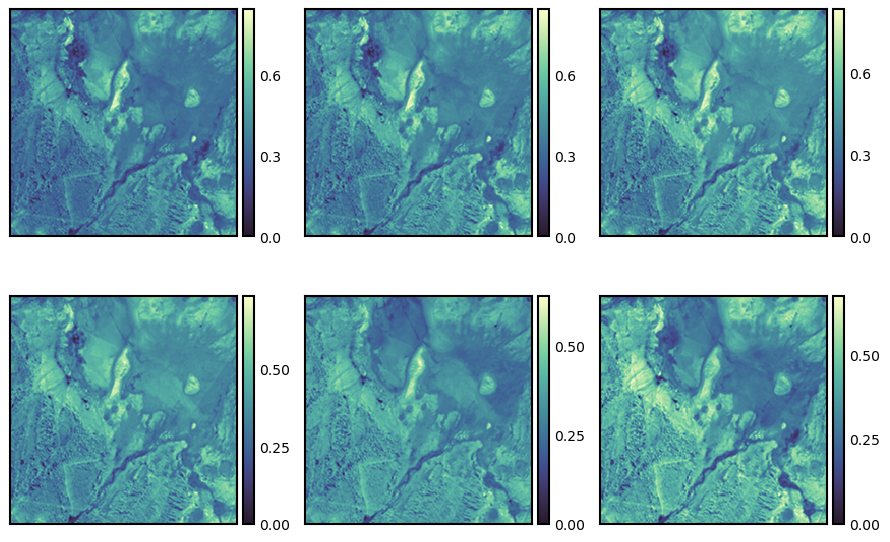

In [96]:
isns.ImageGrid(minmax_image_tensor(example_tif)[0,:6,0,:,:].transpose(1,2,0))

In [98]:
x2 = patchEmbed.forward(torch.tensor(whiten_image_tensor(example_tif).astype('float32')).cuda()).detach()

<Axes: ylabel='Count'>

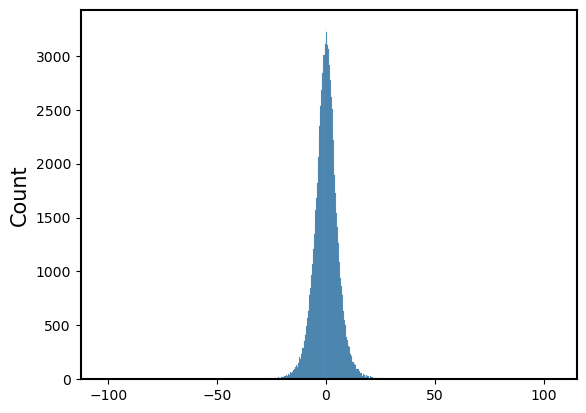

In [101]:
sns.histplot(x2.cpu().flatten())

In [102]:
x2 = x2.cpu().reshape(14, 14, 16, 48)

0it [00:00, ?it/s]

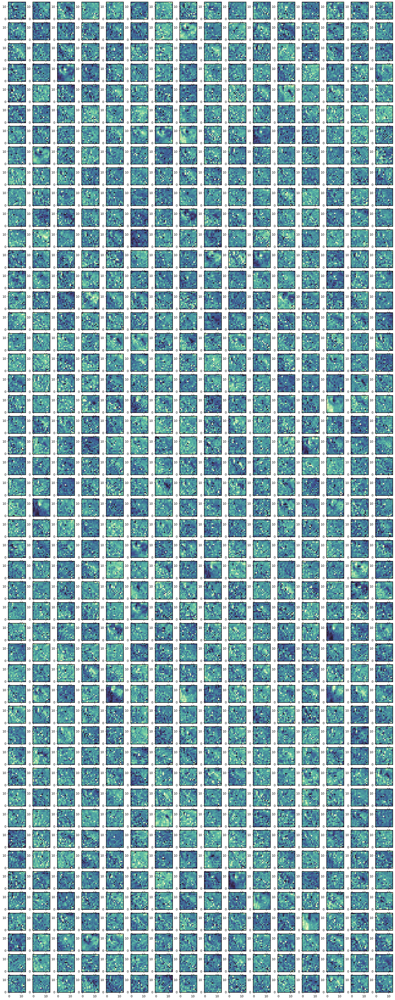

In [493]:
fig, ax = plt.subplots(48, 16, figsize=(5.6*4, 4.8*12))
for i, j in tqdm(product(range(48), range(16))):
    ax[i][j].imshow(x2[:,:,j,i])

## Can we reconstruct one of their images programmatically?

In [339]:
example_tif = rio.open('../Prithvi-100M-demo/HLS.L30.T13REN.2018013T172747.v2.0.B02.B03.B04.B05.B06.B07_cropped.tif').read()

In [340]:
example_tif = np.moveaxis(example_tif, 0, -1) 

In [341]:
NO_DATA = -9999
NO_DATA_FLOAT = 0.0001

In [353]:
example_tif = np.where(example_tif == NO_DATA, NO_DATA_FLOAT, minmax_image(example_tif))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


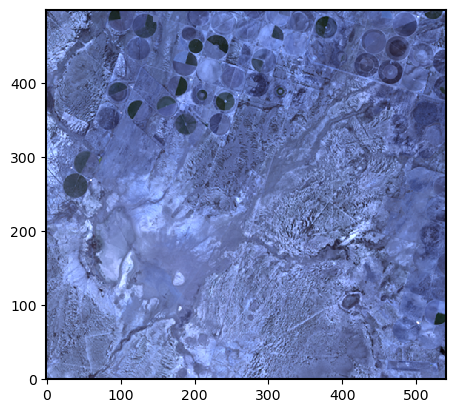

In [354]:
plt.imshow(example_tif[:,:,:3])

#### Create the model

In [119]:
from Prithvi import MaskedAutoencoderViT

In [120]:
import functools

In [126]:
if torch.cuda.is_available():
    device = torch.device('cuda')
else:
    device = torch.device('cpu')

In [122]:
model = MaskedAutoencoderViT(
    img_size=224,
    patch_size=16,
    num_frames=1,
    tubelet_size=1,
    in_chans=6,
    embed_dim=768,
    depth=12,
    num_heads=12,
    decoder_embed_dim=512,
    decoder_depth=8,
    decoder_num_heads=16,
    mlp_ratio=4.,
    norm_layer=functools.partial(torch.nn.LayerNorm, eps=1e-6),
    norm_pix_loss=False
)

In [ ]:
model.to(device)

In [133]:
weights['pos_embed'] = weights['pos_embed'][:,:197,:768]
weights['decoder_pos_embed'] = weights['decoder_pos_embed'][:,:197,:512]

In [134]:
model.load_state_dict(weights)

<All keys matched successfully>

#### Adapt the code from the run_inference script

In [356]:
example_tif = whiten_image(example_tif)

In [357]:
example_tif = example_tif.transpose(2, 0, 1)

In [358]:
example_tif.shape

(6, 500, 540)

In [406]:
example_tif = example_tif.reshape((1, 6, 1, example_tif.shape[-2], example_tif.shape[-1]))

In [407]:
example_tif.shape

(1, 6, 1, 500, 540)

In [408]:
img_size=224
input_data=example_tif
original_h, original_w = input_data.shape[-2:]
pad_h = img_size - (original_h % img_size)
pad_w = img_size - (original_w % img_size)

In [409]:
input_data = np.pad(input_data, ((0, 0), (0, 0), (0, 0), (0, pad_h), (0, pad_w)), mode='reflect')

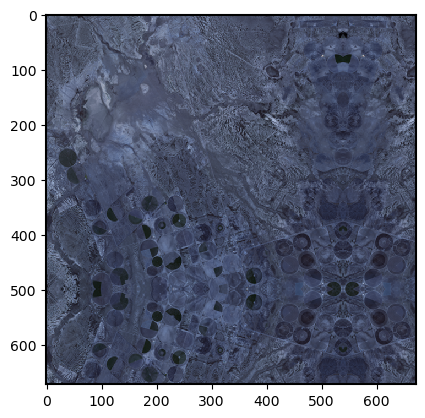

In [410]:
plt.imshow(minmax_image_tensor(input_data)[0,:3,0].transpose(1,2,0))

In [411]:
splitted = \
[np.split(i, input_data.shape[-2]//224, axis=-2) for i in
 np.split(input_data, input_data.shape[-1]//224, axis=-1)]

In [467]:
results = \
[
    [model(torch.Tensor(j.astype('float32')).detach().to(device), 0.75) for j in i]
    for i in splitted
]

In [468]:
list_ = []
for i in results:
    list__ = []
    for j in i:
        _, pred, mask = j
        mask_img = model.unpatchify(mask.unsqueeze(-1).repeat(1, 1, pred.shape[-1])).detach().cpu()
        pred_img = model.unpatchify(pred).detach().cpu()
        list__.append((mask_img, pred_img))
    list_.append(list__)

In [469]:
concatted_image = np.concatenate([np.concatenate([j[1] for j in i], axis=-2) for i in list_], axis=-1)
concatted_mask = np.concatenate([np.concatenate([j[0] for j in i], axis=-2) for i in list_], axis=-1).astype('bool')

In [470]:
overlaid = np.copy(input_data)

In [471]:
overlaid[concatted_mask] = concatted_image[concatted_mask]

In [472]:
overlaid = overlaid[:,:,:,:example_tif.shape[-2],:example_tif.shape[-1]]

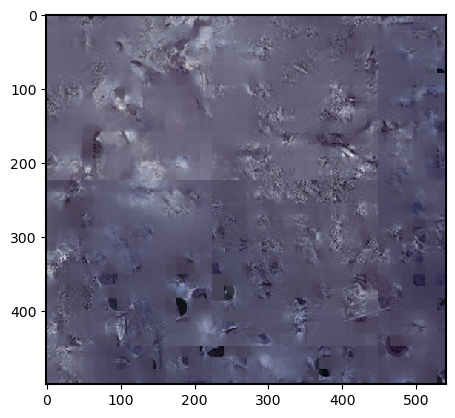

In [473]:
plt.imshow(minmax_image_tensor(overlaid)[0,:3,0].transpose(1, 2, 0))

## The same, but with our own image.

In [486]:
img_10May2021.shape

(8088, 5392, 9)

In [494]:
example_tif = img_10May2021[:,:,[0,1,2]+[bands.index('nir')]*3]

In [495]:
example_tif.shape

(8088, 5392, 6)

In [496]:
NO_DATA = -9999
NO_DATA_FLOAT = 0.0001

In [497]:
example_tif = np.where(example_tif == NO_DATA, NO_DATA_FLOAT, minmax_image(example_tif))

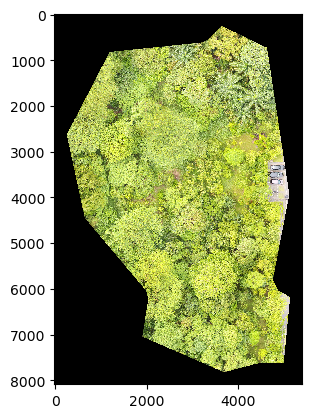

In [498]:
plt.imshow(example_tif[:,:,:3])

#### Create the model

In [499]:
from Prithvi import MaskedAutoencoderViT

In [500]:
import functools

In [501]:
if torch.cuda.is_available():
    device = torch.device('cuda')
else:
    device = torch.device('cpu')

In [502]:
model = MaskedAutoencoderViT(
    img_size=224,
    patch_size=16,
    num_frames=1,
    tubelet_size=1,
    in_chans=6,
    embed_dim=768,
    depth=12,
    num_heads=12,
    decoder_embed_dim=512,
    decoder_depth=8,
    decoder_num_heads=16,
    mlp_ratio=4.,
    norm_layer=functools.partial(torch.nn.LayerNorm, eps=1e-6),
    norm_pix_loss=False
)

In [503]:
model.to(device)

MaskedAutoencoderViT(
  (patch_embed): PatchEmbed(
    (proj): Conv3d(6, 768, kernel_size=(1, 16, 16), stride=(1, 16, 16))
    (norm): Identity()
  )
  (blocks): ModuleList(
    (0-11): 12 x Block(
      (norm1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
      (attn): Attention(
        (qkv): Linear(in_features=768, out_features=2304, bias=True)
        (q_norm): Identity()
        (k_norm): Identity()
        (attn_drop): Dropout(p=0.0, inplace=False)
        (proj): Linear(in_features=768, out_features=768, bias=True)
        (proj_drop): Dropout(p=0.0, inplace=False)
      )
      (ls1): Identity()
      (drop_path1): Identity()
      (norm2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
      (mlp): Mlp(
        (fc1): Linear(in_features=768, out_features=3072, bias=True)
        (act): GELU(approximate='none')
        (drop1): Dropout(p=0.0, inplace=False)
        (norm): Identity()
        (fc2): Linear(in_features=3072, out_features=768, bias=True)
        

In [504]:
weights['pos_embed'] = weights['pos_embed'][:,:197,:768]
weights['decoder_pos_embed'] = weights['decoder_pos_embed'][:,:197,:512]

In [505]:
model.load_state_dict(weights)

<All keys matched successfully>

#### Adapt the code from the run_inference script

In [506]:
example_tif = whiten_image(example_tif)

In [507]:
example_tif = example_tif.transpose(2, 0, 1)

In [508]:
example_tif.shape

(6, 8088, 5392)

In [509]:
example_tif = example_tif.reshape((1, 6, 1, example_tif.shape[-2], example_tif.shape[-1]))

In [510]:
example_tif.shape

(1, 6, 1, 8088, 5392)

In [511]:
img_size=224
input_data=example_tif
original_h, original_w = input_data.shape[-2:]
pad_h = img_size - (original_h % img_size)
pad_w = img_size - (original_w % img_size)

In [512]:
input_data = np.pad(input_data, ((0, 0), (0, 0), (0, 0), (0, pad_h), (0, pad_w)), mode='reflect')

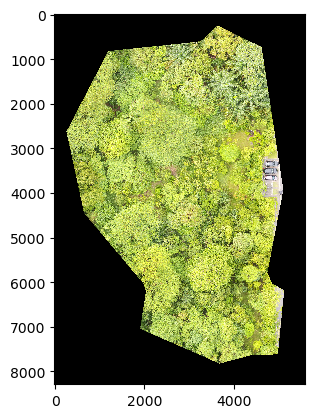

In [513]:
plt.imshow(minmax_image_tensor(input_data)[0,:3,0].transpose(1,2,0))

In [514]:
splitted = \
[np.split(i, input_data.shape[-2]//224, axis=-2) for i in
 np.split(input_data, input_data.shape[-1]//224, axis=-1)]

In [521]:
results = \
[
    [[i.cpu() for i in model(torch.Tensor(j.astype('float32')).detach().to(device), 0.75)] for j in i]
    for i in tqdm(splitted)
]

  0%|          | 0/25 [00:00<?, ?it/s]

In [522]:
list_ = []
for i in results:
    list__ = []
    for j in i:
        _, pred, mask = j
        mask_img = model.unpatchify(mask.unsqueeze(-1).repeat(1, 1, pred.shape[-1])).detach().cpu()
        pred_img = model.unpatchify(pred).detach().cpu()
        list__.append((mask_img, pred_img))
    list_.append(list__)

In [523]:
concatted_image = np.concatenate([np.concatenate([j[1] for j in i], axis=-2) for i in list_], axis=-1)
concatted_mask = np.concatenate([np.concatenate([j[0] for j in i], axis=-2) for i in list_], axis=-1).astype('bool')

In [524]:
overlaid = np.copy(input_data)

In [525]:
overlaid[concatted_mask] = concatted_image[concatted_mask]

In [526]:
overlaid = overlaid[:,:,:,:example_tif.shape[-2],:example_tif.shape[-1]]

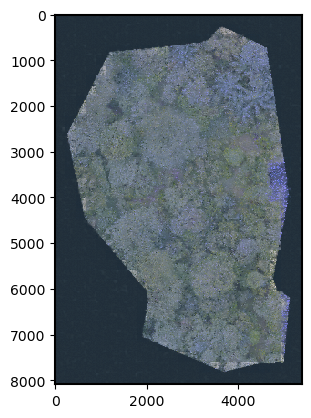

In [527]:
plt.imshow(minmax_image_tensor(overlaid)[0,:3,0].transpose(1, 2, 0))

### Can we do a sliding window?

In [622]:
batch = torch.tensor(input_data, device='cpu')
windows = batch.unfold(3, img_size, img_size).unfold(4, img_size, img_size)
h1, w1 = windows.shape[3:5]
windows = rearrange(windows, 'b c t h1 w1 h w -> (b h1 w1) c t h w', h=img_size, w=img_size)

In [623]:
batch_size=32
num_batches = math.ceil(windows.shape[0] / batch_size) if windows.shape[0] > batch_size else 1
windows = torch.tensor_split(windows, num_batches, dim=0)

In [624]:
from Prithvi_run_inference import run_model
rec_imgs = []
mask_imgs = []
for x in tqdm(windows):
    rec_img, mask_img = run_model(model, x, 0.75, device)
    rec_imgs.append(rec_img)
    mask_imgs.append(mask_img)

  0%|          | 0/29 [00:00<?, ?it/s]

In [568]:
rec_imgs = torch.concat(rec_imgs, dim=0)
mask_imgs = torch.concat(mask_imgs, dim=0)

In [570]:
rec_imgs.shape

torch.Size([925, 6, 1, 224, 224])

In [571]:
num_frames=1
rec_imgs = rearrange(rec_imgs, '(b h1 w1) c t h w -> b c t (h1 h) (w1 w)',
                     h=img_size, w=img_size, b=1, c=6, t=num_frames, h1=h1, w1=w1)
mask_imgs = rearrange(mask_imgs, '(b h1 w1) c t h w -> b c t (h1 h) (w1 w)',
                      h=img_size, w=img_size, b=1, c=6, t=num_frames, h1=h1, w1=w1)

In [598]:
original_h, original_w = example_tif.shape[-2:]
rec_imgs_full = rec_imgs[..., :original_h, :original_w].detach().cpu().numpy()
mask_imgs_full = mask_imgs[..., :original_h, :original_w].detach().cpu().numpy().astype('bool')
batch_full = batch[..., :original_h, :original_w].detach().cpu().numpy()

In [613]:
overlaid = np.copy(input_data[..., :original_h, :original_w])

In [614]:
overlaid[~mask_imgs_full] = rec_imgs_full[~mask_imgs_full]

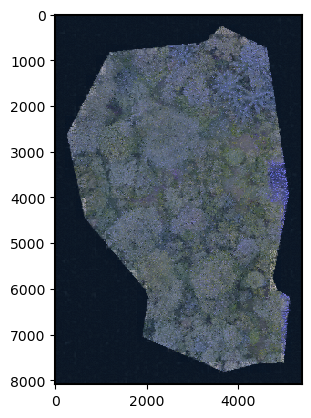

In [615]:
plt.imshow(minmax_image_tensor(overlaid)[0,:3,0].transpose(1, 2, 0))

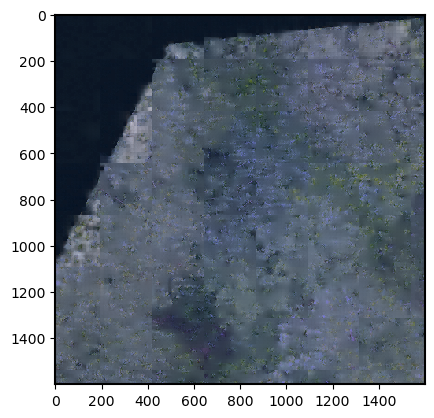

In [620]:
plt.imshow(minmax_image_tensor(overlaid)[0,:3,0,700:2300,700:2300].transpose(1, 2, 0))